In [38]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn
from sklearn.datasets import load_boston
from pandas_profiling import ProfileReport
import pickle
%matplotlib inline

In [11]:
boston = load_boston()
bos = pd.DataFrame(boston.data, columns= boston.feature_names)
bos['target'] = boston.target

In [9]:
bos.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000


In [12]:
bos.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,target
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [14]:
ProfileReport(bos)

In [19]:
y=bos['target']
x = bos.drop(columns = ['target'])

In [20]:
y.shape

(506,)

In [21]:
x.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [16]:
from sklearn.model_selection import train_test_split

<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject


In [22]:
x_train, x_test,y_train, y_test = train_test_split(x,y, test_size=0.33, random_state=10)

In [24]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(x_train,y_train)

<frozen importlib._bootstrap>:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject


LinearRegression()

In [25]:
model.intercept_

34.213297257606115

In [26]:
model.coef_

array([-1.56353750e-01,  6.60616548e-02, -2.01655290e-02,  1.57889806e+00,
       -1.53490777e+01,  3.34105533e+00,  1.14773954e-02, -1.55360652e+00,
        3.05450100e-01, -1.21583833e-02, -8.14405729e-01,  1.32763069e-02,
       -5.45290138e-01])

In [27]:
y_pred = model.predict(x_test)

In [28]:
from sklearn.metrics import mean_squared_error

In [31]:
mse_test = mean_squared_error(y_test, y_pred)
mse_test

27.100991709962717

In [32]:
model.score(x_train,y_train)

0.7424908331488688

In [33]:
model.score(x_test,y_test)

0.716521939396753

In [36]:
## Combine predictions and actual data in a df

res = y_test.to_frame()
res['Prediction'] = y_pred
res.head()

,target,Prediction
305,28.4,31.438496
193,31.1,31.987944
65,23.5,30.998956
349,26.6,22.313967
151,19.6,18.894928


array([<AxesSubplot:>, <AxesSubplot:>], dtype=object)

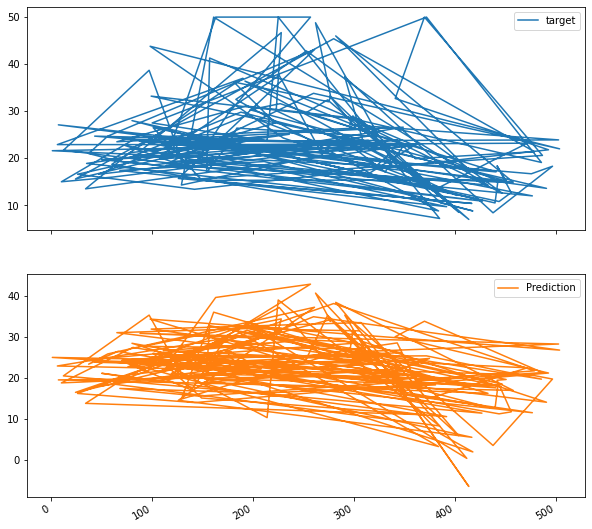

In [39]:
res.plot(subplots=True, figsize = (10, 10))